In [3]:
# Auto-reload modules for development
%load_ext autoreload
%autoreload 2

In [4]:
import os
import sys
project_root = '/home/jz2003/ECS289H/CBExplorer/posthoc-generative-cbm'
notebooks_root = '/home/jz2003/ECS289H/CBExplorer/posthoc-generative-cbm/CE'
if project_root not in sys.path:
    sys.path.insert(0, project_root)
    sys.path.insert(0, notebooks_root)

# Set the current working directory
os.chdir(project_root)
print(f"Current working directory: {os.getcwd()}")
from utils.utils import save_image_grid_with_labels, get_concept_index
import argparse
import numpy as np
from pathlib import Path
import yaml
import torch
from ast import literal_eval
from torch.autograd import Variable
from torchvision.utils import save_image, make_grid
import torch.nn.functional as F
from torch import nn
from models import cbae_stygan2
from torchvision import transforms, models
from utils import gan_loss
import itertools
import warnings
import pickle
import matplotlib.pyplot as plt
from tqdm import tqdm
from eval.eval_intervention_gan import opt_int
import time

from CE_utils import store_ce_images, load_cb_model


Current working directory: /home/jz2003/ECS289H/CBExplorer/posthoc-generative-cbm


## CB-AE Stygan

In [11]:
# dataset to evaluate on
dataset = 'cub'
# experiment name
expt_name = 'cbae_stygan2'
# tensorboard name
tensorboard_name = 'sup_pl_cls8_cbae.pt'
device = 'cuda:0'

# Load configuration
config_file = f"./config/{expt_name}/{dataset}.yaml"

with open(config_file, 'r') as stream:
    config = yaml.safe_load(stream)
print(f"Loaded configuration file {config_file}")

# Validate configuration
# if config['model']['concepts']['concept_names'][-1] != 'unknown':
#     raise ValueError("Last concept name must be 'unknown'")

if not all([type == 'bin' for type in config['model']['concepts']['types'][:-1]]):
    raise ValueError("All but the last concept must be binary")

# Extract concept information
num_cls = len(config['model']['concepts']['concept_bins']) - 1
conc_clsf_classes = config['model']['concepts']['concept_names'][:-1]

print(f"num_cls: {num_cls}")
print(f"conc_clsf_classes: {conc_clsf_classes}")

# Set up model
# config['model']['pretrained'] = 'models/checkpoints/stylegan2-celebahq-256x256.pkl'
model = cbae_stygan2.cbAE_StyGAN2(config)

# Load checkpoint
cbae_ckpt_path = f'models/checkpoints/{dataset}_{expt_name}_{tensorboard_name}'
model.cbae.load_state_dict(torch.load(cbae_ckpt_path, map_location='cpu'))

# Move to device and set to evaluation mode
model.to(device)
model.eval()

Loaded configuration file ./config/cbae_stygan2/cub.yaml
num_cls: 10
conc_clsf_classes: ['Small size 5 to 9 inches', 'Perching like shape', 'Solid breast pattern', 'Black bill color', 'Bill length shorter than head', 'Black wing color', 'Solid belly pattern', 'All purpose bill shape', 'Black upperparts color']
loading stylegan2 from models/checkpoints/stylegan2-cub-256x256.pkl
Total concepts (including unknown): 60
number of layers in CB-AE: 20


cbAE_StyGAN2(
  (gen): Generator(
    (synthesis): SynthesisNetwork(
      (b4): SynthesisBlock(
        (conv1): SynthesisLayer(
          (affine): FullyConnectedLayer()
        )
        (torgb): ToRGBLayer(
          (affine): FullyConnectedLayer()
        )
      )
      (b8): SynthesisBlock(
        (conv0): SynthesisLayer(
          (affine): FullyConnectedLayer()
        )
        (conv1): SynthesisLayer(
          (affine): FullyConnectedLayer()
        )
        (torgb): ToRGBLayer(
          (affine): FullyConnectedLayer()
        )
      )
      (b16): SynthesisBlock(
        (conv0): SynthesisLayer(
          (affine): FullyConnectedLayer()
        )
        (conv1): SynthesisLayer(
          (affine): FullyConnectedLayer()
        )
        (torgb): ToRGBLayer(
          (affine): FullyConnectedLayer()
        )
      )
      (b32): SynthesisBlock(
        (conv0): SynthesisLayer(
          (affine): FullyConnectedLayer()
        )
        (conv1): SynthesisLayer(
       

In [17]:
seed = 50
torch.manual_seed(seed)
np.random.seed(seed)

# Generate a single latent vector from the seed
z = torch.randn((1, model.gen.z_dim), device=device)
latent = model.gen.mapping(z, None, truncation_psi=1.0, truncation_cutoff=None)

# Get the original concepts for this latent
concepts = model.cbae.enc(latent)

# Generate all combinations of 8 binary concepts (2^8 = 256 combinations)
num_concepts = 8
all_combinations = list(itertools.product([0, 1], repeat=num_concepts))

print(f"Total combinations: {len(all_combinations)}")
print(f"Concepts: {conc_clsf_classes}")


# Store all generated images
all_images = []

# Generate images for all combinations
for combo in tqdm(all_combinations):
    new_concepts = concepts.clone()
    
    # Set each concept to the desired value in this combination
    for concept_idx, concept_val in enumerate(combo):
        start, end = get_concept_index(model, concept_idx)
        c_concepts = concepts[:, start:end]
        _, num_c = c_concepts.shape
        
        # Swap the max value to the concept we need
        new_c_concepts = c_concepts.clone()
        old_vals = new_c_concepts[:, concept_val].clone()
        max_val, max_ind = torch.max(new_c_concepts, dim=1)
        new_c_concepts[:, concept_val] = max_val
        for swap_idx, (curr_ind, curr_old_val) in enumerate(zip(max_ind, old_vals)):
            new_c_concepts[swap_idx, curr_ind] = curr_old_val
        
        new_concepts[:, start:end] = new_c_concepts
    
    # Decode and generate image
    new_latent = model.cbae.dec(new_concepts)
    gen_img = model.gen.synthesis(new_latent, noise_mode='const')
    gen_img = gen_img.mul(0.5).add_(0.5)
    
    all_images.append(gen_img.detach().cpu())

# Concatenate all images
all_images_tensor = torch.cat(all_images, dim=0)
print(f"Generated {len(all_images_tensor)} images with shape {all_images_tensor.shape}")


Total combinations: 256
Concepts: ['Small size 5 to 9 inches', 'Perching like shape', 'Solid breast pattern', 'Black bill color', 'Bill length shorter than head', 'Black wing color', 'Solid belly pattern', 'All purpose bill shape', 'Black upperparts color']


  0%|          | 0/256 [00:00<?, ?it/s]

100%|██████████| 256/256 [00:04<00:00, 52.01it/s]

Generated 256 images with shape torch.Size([256, 3, 256, 256])


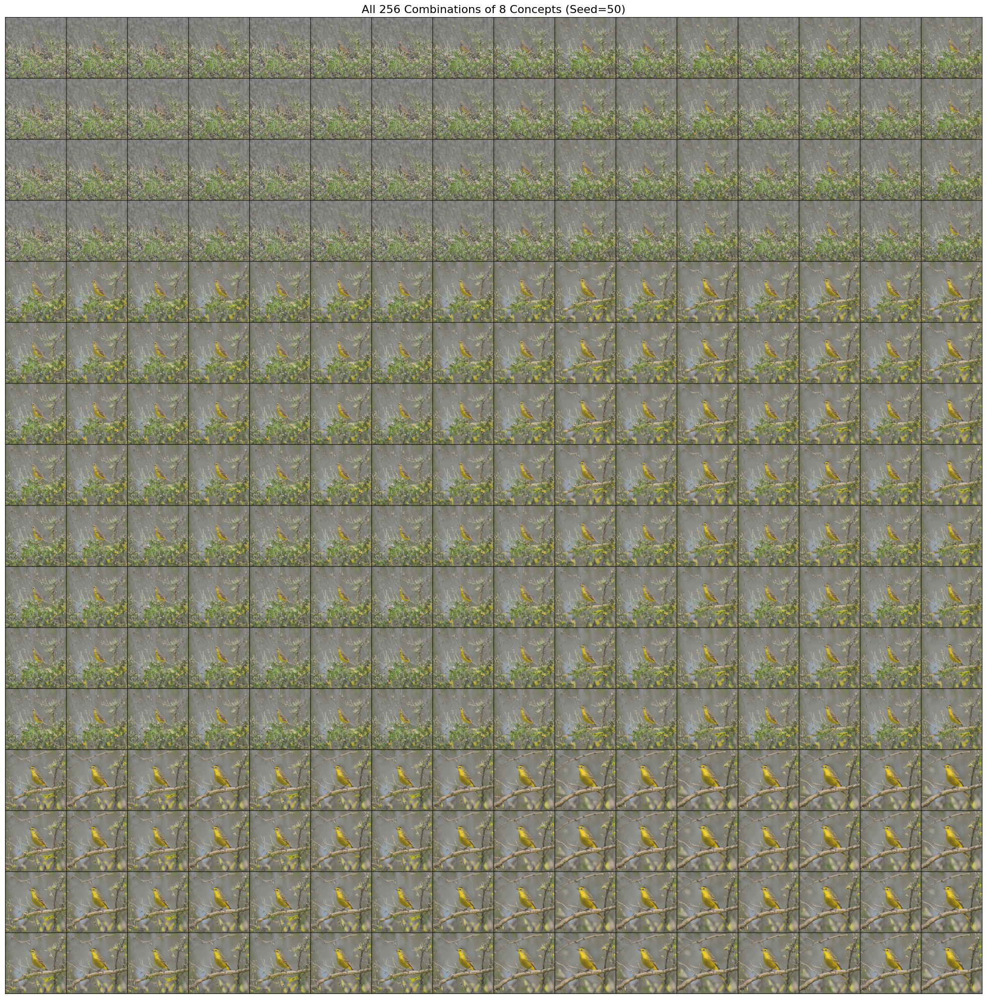


Concepts (in order): ['Small size 5 to 9 inches', 'Perching like shape', 'Solid breast pattern', 'Black bill color', 'Bill length shorter than head', 'Black wing color', 'Solid belly pattern', 'All purpose bill shape', 'Black upperparts color']
Total combinations shown: 256


In [18]:
# Create a grid visualization of all 256 combinations (16x16 grid)
grid = make_grid(all_images_tensor, nrow=16, padding=2, normalize=True)

# Display the grid
fig, ax = plt.subplots(1, 1, figsize=(20, 20))
npimg = grid.numpy()
npimg = np.transpose(npimg, (1, 2, 0))  # CHW to HWC
ax.imshow(npimg)
ax.set_title(f'All 256 Combinations of 8 Concepts (Seed={seed})', fontsize=16)
ax.axis('off')

plt.tight_layout()
plt.show()

print(f"\nConcepts (in order): {conc_clsf_classes}")
print(f"Total combinations shown: {len(all_combinations)}")


In [20]:
store_ce_images(all_combinations, all_images_tensor, expt_name, dataset, config_file, seed)

Saving images to CE_data/cbae_stygan2_thr90-celebahq/44


Saving images: 0it [00:00, ?it/s]

Saving images: 256it [00:08, 30.16it/s]

Saved 256 images
Copied config file to CE_data/cbae_stygan2_thr90-celebahq/44/celebahq.yaml


PosixPath('CE_data/cbae_stygan2_thr90-celebahq/44')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


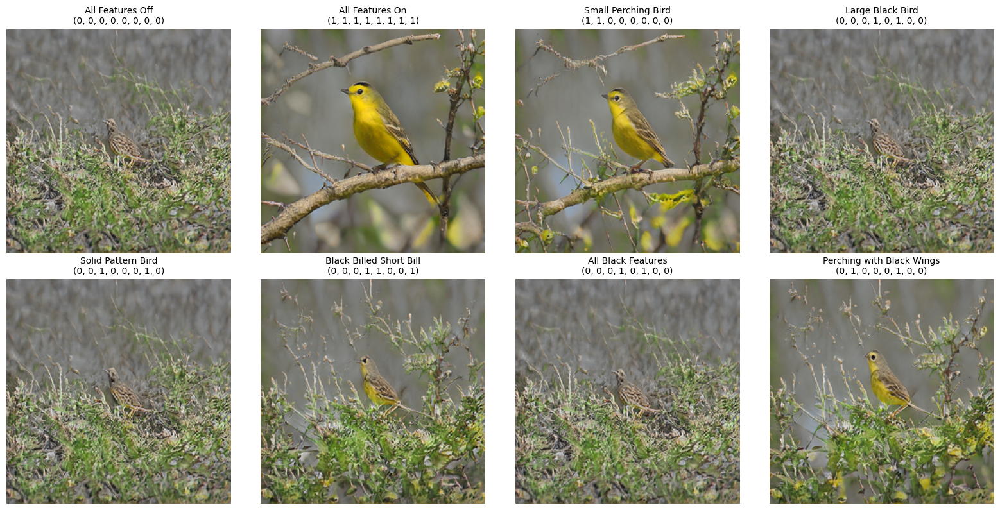


Concept meanings:
  Position 0: Small size 5 to 9 inches
  Position 1: Perching like shape
  Position 2: Solid breast pattern
  Position 3: Black bill color
  Position 4: Bill length shorter than head
  Position 5: Black wing color
  Position 6: Solid belly pattern
  Position 7: All purpose bill shape
  Position 8: Black upperparts color


In [19]:
# Let's look at some interesting specific combinations

# Define some interesting combinations to showcase
interesting_combinations = {
    'All Features Off': (0, 0, 0, 0, 0, 0, 0, 0),
    'All Features On': (1, 1, 1, 1, 1, 1, 1, 1),
    'Small Perching Bird': (1, 1, 0, 0, 0, 0, 0, 0),  # Small size + perching shape
    'Large Black Bird': (0, 0, 0, 1, 0, 1, 0, 0),  # Not small + black features
    'Solid Pattern Bird': (0, 0, 1, 0, 0, 0, 1, 0),  # Solid breast + solid belly
    'Black Billed Short Bill': (0, 0, 0, 1, 1, 0, 0, 1),  # Black bill + short bill + all purpose shape
    'All Black Features': (0, 0, 0, 1, 0, 1, 0, 0),  # Black bill + black wing + black upperparts
    'Perching with Black Wings': (0, 1, 0, 0, 0, 1, 0, 0),  # Perching + black wings
}

# Create images for these combinations
interesting_images = []
interesting_labels = []

for label, combo in interesting_combinations.items():
    new_concepts = concepts.clone()
    
    # Set each concept to the desired value in this combination
    for concept_idx, concept_val in enumerate(combo):
        start, end = get_concept_index(model, concept_idx)
        c_concepts = concepts[:, start:end]
        _, num_c = c_concepts.shape
        
        # Swap the max value to the concept we need
        new_c_concepts = c_concepts.clone()
        old_vals = new_c_concepts[:, concept_val].clone()
        max_val, max_ind = torch.max(new_c_concepts, dim=1)
        new_c_concepts[:, concept_val] = max_val
        for swap_idx, (curr_ind, curr_old_val) in enumerate(zip(max_ind, old_vals)):
            new_c_concepts[swap_idx, curr_ind] = curr_old_val
        
        new_concepts[:, start:end] = new_c_concepts
    
    # Decode and generate image
    new_latent = model.cbae.dec(new_concepts)
    gen_img = model.gen.synthesis(new_latent, noise_mode='const')
    gen_img = gen_img.mul(0.5).add_(0.5)
    
    interesting_images.append(gen_img.detach().cpu())
    interesting_labels.append(f"{label}\n{combo}")

# Concatenate all images
interesting_images_tensor = torch.cat(interesting_images, dim=0)

# Create a grid visualization
ncols = 4
nrows = (len(interesting_images) + ncols - 1) // ncols

fig, axes = plt.subplots(nrows, ncols, figsize=(16, 4*nrows))
axes = axes.flatten()

for idx, (img, label) in enumerate(zip(interesting_images_tensor, interesting_labels)):
    npimg = img.numpy()
    npimg = np.transpose(npimg, (1, 2, 0))  # CHW to HWC
    axes[idx].imshow(npimg)
    axes[idx].set_title(label, fontsize=10)
    axes[idx].axis('off')

# Hide any unused subplots
for idx in range(len(interesting_images), len(axes)):
    axes[idx].axis('off')

plt.tight_layout()
plt.show()

print(f"\nConcept meanings:")
for i, concept_name in enumerate(conc_clsf_classes):
    print(f"  Position {i}: {concept_name}")


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


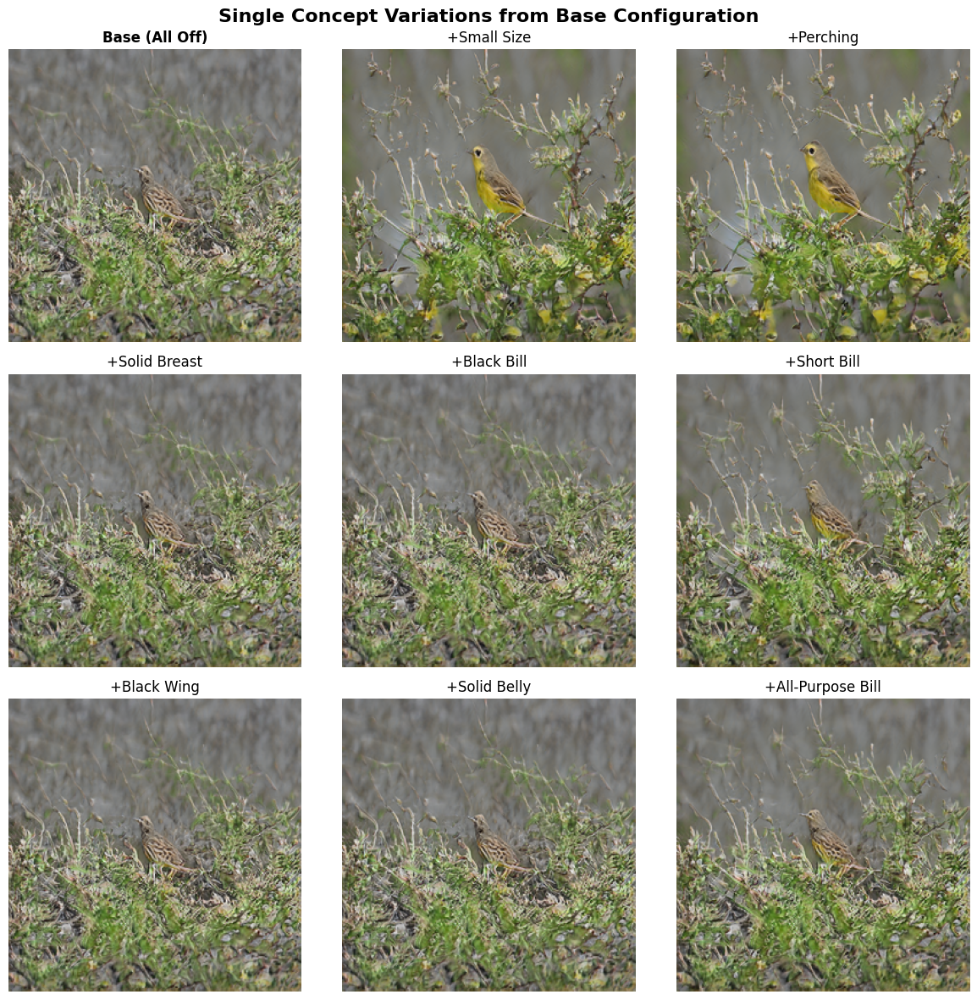


This shows how each concept individually affects the generated bird image.


In [20]:
# Let's explore concept transitions - show how changing one concept at a time affects the image
# Starting from a base configuration

base_combo = (0, 0, 0, 0, 0, 0, 0, 0)  # All features off
variations = {
    'Base (All Off)': base_combo,
}

# Add variations where we turn on each concept one at a time
concept_short_names = [
    'Small Size',
    'Perching',
    'Solid Breast',
    'Black Bill',
    'Short Bill',
    'Black Wing',
    'Solid Belly',
    'All-Purpose Bill',
]

for i in range(len(base_combo)):
    varied_combo = list(base_combo)
    varied_combo[i] = 1
    variations[f'+{concept_short_names[i]}'] = tuple(varied_combo)

# Generate images for all variations
variation_images = []
variation_labels = []

for label, combo in variations.items():
    new_concepts = concepts.clone()
    
    for concept_idx, concept_val in enumerate(combo):
        start, end = get_concept_index(model, concept_idx)
        c_concepts = concepts[:, start:end]
        _, num_c = c_concepts.shape
        
        new_c_concepts = c_concepts.clone()
        old_vals = new_c_concepts[:, concept_val].clone()
        max_val, max_ind = torch.max(new_c_concepts, dim=1)
        new_c_concepts[:, concept_val] = max_val
        for swap_idx, (curr_ind, curr_old_val) in enumerate(zip(max_ind, old_vals)):
            new_c_concepts[swap_idx, curr_ind] = curr_old_val
        
        new_concepts[:, start:end] = new_c_concepts
    
    new_latent = model.cbae.dec(new_concepts)
    gen_img = model.gen.synthesis(new_latent, noise_mode='const')
    gen_img = gen_img.mul(0.5).add_(0.5)
    
    variation_images.append(gen_img.detach().cpu())
    variation_labels.append(label)

# Concatenate all images
variation_images_tensor = torch.cat(variation_images, dim=0)

# Create a grid visualization (3 rows x 3 columns)
ncols = 3
nrows = (len(variation_images) + ncols - 1) // ncols

fig, axes = plt.subplots(nrows, ncols, figsize=(12, 4*nrows))
axes = axes.flatten()

for idx, (img, label) in enumerate(zip(variation_images_tensor, variation_labels)):
    npimg = img.numpy()
    npimg = np.transpose(npimg, (1, 2, 0))
    axes[idx].imshow(npimg)
    axes[idx].set_title(label, fontsize=12, fontweight='bold' if idx == 0 else 'normal')
    axes[idx].axis('off')
    
    # Add a border to the base image
    if idx == 0:
        for spine in axes[idx].spines.values():
            spine.set_visible(True)
            spine.set_color('red')
            spine.set_linewidth(3)

# Hide any unused subplots
for idx in range(len(variation_images), len(axes)):
    axes[idx].axis('off')

plt.suptitle('Single Concept Variations from Base Configuration', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

print("\nThis shows how each concept individually affects the generated bird image.")


In [ ]:
# Let's explore some more specific bird archetypes and interesting combinations

bird_archetypes = {
    'Tiny Sparrow-like': (1, 1, 1, 0, 1, 0, 1, 1),  # Small, perching, solid patterns, short bill
    'Large Crow-like': (0, 0, 0, 1, 0, 1, 0, 0),  # Large, black features
    'Mixed Pattern Bird': (1, 1, 1, 0, 0, 0, 0, 0),  # Small, perching with solid breast only
    'Contrasting Features': (1, 0, 1, 1, 1, 1, 1, 0),  # Small but with black features
    'All Black, All Solid': (0, 0, 1, 1, 0, 1, 1, 0),  # Solid patterns with black features
    'Perching Specialist': (0, 1, 0, 0, 1, 0, 0, 1),  # Perching with bill features
    'Pattern Specialist': (0, 0, 1, 0, 0, 0, 1, 0),  # Just solid patterns
    'Bill Specialist': (0, 0, 0, 1, 1, 0, 0, 1),  # All bill features
    'Wing Specialist': (0, 0, 0, 0, 0, 1, 0, 0),  # Just black wings
    'Minimal Features': (1, 0, 0, 0, 0, 0, 0, 0),  # Just small size
}

# Generate images
archetype_images = []
archetype_labels = []

for label, combo in bird_archetypes.items():
    new_concepts = concepts.clone()
    
    for concept_idx, concept_val in enumerate(combo):
        start, end = get_concept_index(model, concept_idx)
        c_concepts = concepts[:, start:end]
        _, num_c = c_concepts.shape
        
        new_c_concepts = c_concepts.clone()
        old_vals = new_c_concepts[:, concept_val].clone()
        max_val, max_ind = torch.max(new_c_concepts, dim=1)
        new_c_concepts[:, concept_val] = max_val
        for swap_idx, (curr_ind, curr_old_val) in enumerate(zip(max_ind, old_vals)):
            new_c_concepts[swap_idx, curr_ind] = curr_old_val
        
        new_concepts[:, start:end] = new_c_concepts
    
    new_latent = model.cbae.dec(new_concepts)
    gen_img = model.gen.synthesis(new_latent, noise_mode='const')
    gen_img = gen_img.mul(0.5).add_(0.5)
    
    archetype_images.append(gen_img.detach().cpu())
    archetype_labels.append(f"{label}\n{combo}")

# Concatenate all images
archetype_images_tensor = torch.cat(archetype_images, dim=0)

# Create a grid visualization
ncols = 5
nrows = (len(archetype_images) + ncols - 1) // ncols

fig, axes = plt.subplots(nrows, ncols, figsize=(20, 4*nrows))
axes = axes.flatten()

for idx, (img, label) in enumerate(zip(archetype_images_tensor, archetype_labels)):
    npimg = img.numpy()
    npimg = np.transpose(npimg, (1, 2, 0))
    axes[idx].imshow(npimg)
    axes[idx].set_title(label, fontsize=10)
    axes[idx].axis('off')

# Hide any unused subplots
for idx in range(len(archetype_images), len(axes)):
    axes[idx].axis('off')

plt.suptitle('Bird Archetypes - Interesting Concept Combinations', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

print("\nThese combinations showcase different bird types based on specific feature sets.")
print("\nConcept Legend:")
for i, concept_name in enumerate(conc_clsf_classes):
    print(f"  Position {i}: {concept_name}")


In [ ]:
# Define interesting concept combinations
# Format: (combination_tuple, description)
interesting_combos = [
    # All features OFF (baseline)
    ((0, 0, 0, 0, 0, 0, 0, 0), "All concepts OFF (baseline)"),
    
    # All features ON (maximum)
    ((1, 1, 1, 1, 1, 1, 1, 1), "All concepts ON (maximum)"),
    
    # Size variations
    ((1, 0, 0, 0, 0, 0, 0, 0), "Small size only"),
    ((0, 1, 0, 0, 0, 0, 0, 0), "Perching shape only"),
    ((1, 1, 0, 0, 0, 0, 0, 0), "Small & perching"),
    
    # Color combinations
    ((0, 0, 0, 1, 0, 1, 0, 0), "Black bill & wings"),
    ((0, 0, 0, 1, 0, 1, 0, 0, 1), "All black features"),
    ((0, 0, 1, 0, 0, 0, 1, 0), "Solid patterns"),
    
    # Mixed interesting combinations
    ((1, 1, 1, 1, 0, 0, 0, 0), "Size/shape/patterns"),
    ((0, 0, 0, 1, 1, 1, 0, 1), "All bill & wing features"),
    ((1, 0, 1, 0, 1, 0, 1, 0), "Alternating features (odd)"),
    ((0, 1, 0, 1, 0, 1, 0, 1), "Alternating features (even)"),
    
    # Body pattern combinations
    ((0, 0, 1, 0, 0, 0, 1, 0), "Solid breast & belly"),
    ((1, 1, 1, 0, 0, 0, 1, 0), "Small bird with solid patterns"),
    
    # Specific bird-like combinations
    ((1, 1, 0, 1, 1, 1, 0, 1), "Typical small black bird"),
    ((0, 1, 1, 0, 0, 0, 1, 1), "Perching bird with patterns"),
]

# Get indices for these combinations
combo_indices = []
for combo, desc in interesting_combos:
    try:
        idx = all_combinations.index(combo)
        combo_indices.append((idx, combo, desc))
    except ValueError:
        print(f"Warning: Combination {combo} not found")

print(f"Found {len(combo_indices)} interesting combinations")

# Create concept names with abbreviations for visualization
concept_abbrev = [
    "Small",      # Small size 5 to 9 inches
    "Perch",      # Perching like shape
    "SolidBr",    # Solid breast pattern
    "BlkBill",    # Black bill color
    "ShortBill",  # Bill length shorter than head
    "BlkWing",    # Black wing color
    "SolidBel",   # Solid belly pattern
    "AllPBill",   # All purpose bill shape
]


### Side-by-Side Comparisons

Let's compare specific concept changes to see their individual effects.


In [ ]:
# Compare pairs: baseline vs single concept changes
comparison_pairs = [
    ("Baseline", (0, 0, 0, 0, 0, 0, 0, 0)),
    ("Adding Small Size", (1, 0, 0, 0, 0, 0, 0, 0)),
    ("Adding Perching Shape", (0, 1, 0, 0, 0, 0, 0, 0)),
    ("Adding Black Bill", (0, 0, 0, 1, 0, 0, 0, 0)),
    ("Adding Black Wings", (0, 0, 0, 0, 0, 1, 0, 0)),
    ("Adding Solid Patterns", (0, 0, 1, 0, 0, 0, 1, 0)),
]

# Visualize comparisons
num_comparisons = len(comparison_pairs)
fig, axes = plt.subplots(2, num_comparisons, figsize=(20, 7))

for col_idx, (label, combo) in enumerate(comparison_pairs):
    # Find the image index for this combination
    img_idx = all_combinations.index(combo)
    img = all_images_tensor[img_idx]
    
    # Convert to numpy for display
    npimg = img.numpy()
    npimg = np.transpose(npimg, (1, 2, 0))  # CHW to HWC
    
    # Display in first row
    axes[0, col_idx].imshow(npimg)
    axes[0, col_idx].set_title(label, fontsize=10)
    axes[0, col_idx].axis('off')
    
    # Create a binary representation for second row
    binary_str = ''.join([str(c) for c in combo])
    axes[1, col_idx].text(0.5, 0.5, binary_str, 
                          ha='center', va='center', 
                          fontsize=8, family='monospace',
                          bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))
    axes[1, col_idx].set_xlim(0, 1)
    axes[1, col_idx].set_ylim(0, 1)
    axes[1, col_idx].axis('off')

plt.suptitle("Effect of Individual Concepts (Binary: Small|Perch|SolidBr|BlkBill|ShortBill|BlkWing|SolidBel|AllPBill)", 
             fontsize=12, y=0.98)
plt.tight_layout()
plt.show()


### Concept Transition Sequences

Let's visualize smooth transitions by progressively adding concepts.


In [ ]:
# Create a progressive sequence: start from baseline and add concepts one by one
sequences = [
    {
        "name": "Building a Small Black Bird",
        "steps": [
            (0, 0, 0, 0, 0, 0, 0, 0),  # Start
            (1, 0, 0, 0, 0, 0, 0, 0),  # Add small
            (1, 1, 0, 0, 0, 0, 0, 0),  # Add perching
            (1, 1, 0, 1, 0, 0, 0, 0),  # Add black bill
            (1, 1, 0, 1, 0, 1, 0, 0),  # Add black wing
            (1, 1, 0, 1, 1, 1, 0, 1),  # Add bill features
        ]
    },
    {
        "name": "Adding Solid Patterns",
        "steps": [
            (0, 0, 0, 0, 0, 0, 0, 0),  # Start
            (0, 0, 1, 0, 0, 0, 0, 0),  # Solid breast
            (0, 0, 1, 0, 0, 0, 1, 0),  # Solid breast + belly
            (1, 0, 1, 0, 0, 0, 1, 0),  # Add small
            (1, 1, 1, 0, 0, 0, 1, 0),  # Add perching
        ]
    },
    {
        "name": "Extreme Transitions",
        "steps": [
            (0, 0, 0, 0, 0, 0, 0, 0),  # All OFF
            (1, 0, 1, 0, 1, 0, 1, 0),  # Alternating
            (0, 1, 0, 1, 0, 1, 0, 1),  # Opposite alternating
            (1, 1, 1, 1, 0, 0, 0, 0),  # First half
            (0, 0, 0, 0, 1, 1, 1, 1),  # Second half
            (1, 1, 1, 1, 1, 1, 1, 1),  # All ON
        ]
    }
]

# Visualize each sequence
for seq in sequences:
    num_steps = len(seq["steps"])
    fig, axes = plt.subplots(1, num_steps, figsize=(3*num_steps, 3))
    
    if num_steps == 1:
        axes = [axes]
    
    for step_idx, combo in enumerate(seq["steps"]):
        # Find the image index
        img_idx = all_combinations.index(combo)
        img = all_images_tensor[img_idx]
        
        # Convert to numpy
        npimg = img.numpy()
        npimg = np.transpose(npimg, (1, 2, 0))
        
        # Display
        axes[step_idx].imshow(npimg)
        
        # Show which concepts are ON
        active = [concept_abbrev[i] for i, val in enumerate(combo) if val == 1]
        binary_str = ''.join([str(c) for c in combo])
        
        title = f"Step {step_idx+1}\n{binary_str}"
        if active:
            title += f"\n({', '.join(active)})"
        else:
            title += "\n(None)"
            
        axes[step_idx].set_title(title, fontsize=8)
        axes[step_idx].axis('off')
    
    plt.suptitle(seq["name"], fontsize=12, y=1.02)
    plt.tight_layout()
    plt.show()


In [ ]:
# Visualize the interesting combinations
num_rows = 4
num_cols = 4
fig, axes = plt.subplots(num_rows, num_cols, figsize=(16, 16))
axes = axes.flatten()

for plot_idx, (img_idx, combo, desc) in enumerate(combo_indices):
    if plot_idx >= num_rows * num_cols:
        break
    
    # Get the image
    img = all_images_tensor[img_idx]
    
    # Convert to numpy for display
    npimg = img.numpy()
    npimg = np.transpose(npimg, (1, 2, 0))  # CHW to HWC
    
    # Create label showing which concepts are ON
    active_concepts = [concept_abbrev[i] for i, val in enumerate(combo) if val == 1]
    if active_concepts:
        concepts_str = ", ".join(active_concepts)
    else:
        concepts_str = "None"
    
    # Display image
    axes[plot_idx].imshow(npimg)
    axes[plot_idx].set_title(f"{desc}\n[{concepts_str}]", fontsize=9, wrap=True)
    axes[plot_idx].axis('off')

# Hide any unused subplots
for idx in range(len(combo_indices), len(axes)):
    axes[idx].axis('off')

plt.suptitle(f"Interesting Concept Combinations (Seed={seed})", fontsize=14, y=0.995)
plt.tight_layout()
plt.show()

print("\nConcept Key:")
for abbrev, full_name in zip(concept_abbrev, conc_clsf_classes):
    print(f"  {abbrev}: {full_name}")


## Interesting Concept Combinations

Let's visualize some interesting combinations of concepts to see how they affect the generated bird images.
